<a href="https://colab.research.google.com/github/jasminecjwchen/COMS-4995-ACV-Project/blob/main/grad_cam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Applying GradCam for Explainability of Spoof Classifications

### Implementing my own version of the GradCAM

Imports

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import os
import matplotlib.pyplot as plt
from PIL import Image
import json
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, recall_score, accuracy_score
from torch.utils.data import Dataset
from torchvision import transforms
import numpy as np
from sklearn.metrics import recall_score
from tqdm import tqdm
import cv2


File Prep

In [ ]:
# The filepath holds our train_subset dataset
!gdown "https://drive.google.com/uc?id=1P-ypjfLTZsEpBSyMdzoeThlWd-l1a5rN"

Downloading...
From (original): https://drive.google.com/uc?id=1P-ypjfLTZsEpBSyMdzoeThlWd-l1a5rN
From (redirected): https://drive.google.com/uc?id=1P-ypjfLTZsEpBSyMdzoeThlWd-l1a5rN&confirm=t&uuid=5dfd8c64-9475-4f2b-93f2-82d3bb86960b
To: /content/preprocessed_data-20240325T171740Z-001.zip
100% 415M/415M [00:05<00:00, 78.2MB/s]


In [ ]:
!ls

multiclass_cnn.pth  preprocessed_data-20240325T171740Z-001.zip	sample_data


In [ ]:
!unzip preprocessed_data-20240325T171740Z-001.zip

Streaming output truncated to the last 5000 lines.
  inflating: preprocessed_data/spoof/026420.jpg  
  inflating: preprocessed_data/spoof/082396.jpg  
  inflating: preprocessed_data/spoof/293551.jpg  
  inflating: preprocessed_data/spoof/169445.jpg  
  inflating: preprocessed_data/spoof/380539.jpg  
  inflating: preprocessed_data/spoof/071578.jpg  
  inflating: preprocessed_data/spoof/294558.jpg  
  inflating: preprocessed_data/spoof/220943.jpg  
  inflating: preprocessed_data/spoof/114486.jpg  
  inflating: preprocessed_data/spoof/083088.jpg  
  inflating: preprocessed_data/spoof/489034.jpg  
  inflating: preprocessed_data/spoof/076571.jpg  
  inflating: preprocessed_data/spoof/134030.jpg  
  inflating: preprocessed_data/spoof/126434.jpg  
  inflating: preprocessed_data/spoof/347099.jpg  
  inflating: preprocessed_data/spoof/281633.jpg  
  inflating: preprocessed_data/spoof/358152.jpg  
  inflating: preprocessed_data/spoof/036155.jpg  
  inflating: preprocessed_data/spoof/398410.jpg  

In [90]:
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.fc1 = nn.Linear(64 * 56 * 56, 512)
        self.fc2 = nn.Linear(512, 5)
        self.feature_maps = None  # placeholder for feature maps

        # register hook to capture the output of the last conv layer
        self.conv2.register_forward_hook(self.save_feature_maps)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

    def save_feature_maps(self, module, input, output):
        self.feature_maps = output
        self.feature_maps.retain_grad()  # tell PyTorch to save gradients for this tensor

In [4]:
# function to compute Grad-CAM and return both heatmap and prediction
def grad_cam_with_prediction(model, image, label_index):
    model.eval()
    output = model(image)
    _, prediction = torch.max(output, 1)
    predicted_class = prediction.item()
    class_loss = output[0, label_index]
    class_loss.backward()
    gradients = model.feature_maps.grad
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
    activations = model.feature_maps.detach()
    for i in range(pooled_gradients.size(0)):
        activations[:, i, :, :] *= pooled_gradients[i]
    heatmap = torch.mean(activations, dim=1).squeeze()
    heatmap = F.relu(heatmap)
    heatmap /= torch.max(heatmap)
    return heatmap.numpy(), predicted_class

In [41]:
def show_cam_on_image(img, mask):
    # resize the heatmap to match the size of the original image
    heatmap = cv2.resize(mask, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # apply the heatmap color mapping
    heatmap = np.float32(heatmap) / 255  # convert back to [0, 1] for superimposing

    # superimpose the heatmap onto the original image
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)  # normalize between [0, 1]
    return np.uint8(255 * cam)  # scale up to [0, 255] to make a valid image format


In [6]:
model = CNNModel()
model.load_state_dict(torch.load('multiclass_cnn.pth'))
model.eval()

CNNModel(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (fc1): Linear(in_features=200704, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=5, bias=True)
)

In [81]:
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [91]:
class SpoofDataset(Dataset):
    def __init__(self, data_dir, label_file, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        with open(label_file, 'r') as f:
            self.labels = json.load(f)

        self.img_paths = []
        self.img_labels = []
        for img_name, label in self.labels.items():
            subfolder = 'live' if label == 0 else 'spoof'
            full_path = os.path.join(self.data_dir, subfolder, img_name)
            if os.path.exists(full_path):
                self.img_paths.append(full_path)
                self.img_labels.append(label)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.img_labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label


In [89]:
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
class_names = {0: "Live", 1: "Print", 2: "Papercut", 3: "Replay", 4: "3D"}

In [10]:
!head -1 train_label.json

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



0603.jpg": 1, "420604.jpg": 3, "420605.jpg": 1, "420606.jpg": 1, "420607.jpg": 3, "420608.jpg": 0, "420609.jpg": 3, "420610.jpg": 2, "420611.jpg": 4, "420612.jpg": 1, "420613.jpg": 1, "420614.jpg": 0, "420615.jpg": 0, "420616.jpg": 3, "420617.jpg": 2, "420618.jpg": 3, "420619.jpg": 0, "420620.jpg": 0, "420621.jpg": 0, "420622.jpg": 0, "420623.jpg": 1, "420624.jpg": 0, "420625.jpg": 0, "420626.jpg": 1, "420627.jpg": 3, "420628.jpg": 0, "420629.jpg": 1, "420630.jpg": 2, "420631.jpg": 1, "420632.jpg": 3, "420633.jpg": 3, "420634.jpg": 4, "420635.jpg": 4, "420636.jpg": 4, "420637.jpg": 3, "420638.jpg": 0, "420639.jpg": 0, "420640.jpg": 1, "420641.jpg": 0, "420642.jpg": 0, "420643.jpg": 3, "420644.jpg": 3, "420645.jpg": 3, "420646.jpg": 0, "420647.jpg": 0, "420648.jpg": 0, "420649.jpg": 3, "420650.jpg": 4, "420651.jpg": 1, "420652.jpg": 0, "420653.jpg": 2, "420654.jpg": 3, "420655.jpg": 3, "420656.jpg": 2, "420657.jpg": 3, "420658.jpg": 2, "420659.jpg": 2, "420660.jpg": 4, "420661.jpg": 0, 

In [79]:
dataset = SpoofDataset(data_dir='preprocessed_data', label_file='train_label.json', transform=data_transforms)

# collect  images for each class
class_images = {0: [], 1: [], 2: [], 3: [], 4: []}
for image, label in dataset:
    if len(class_images[label]) < 3:
        class_images[label].append(image)
    if all(len(images) == 3 for images in class_images.values()):
        break


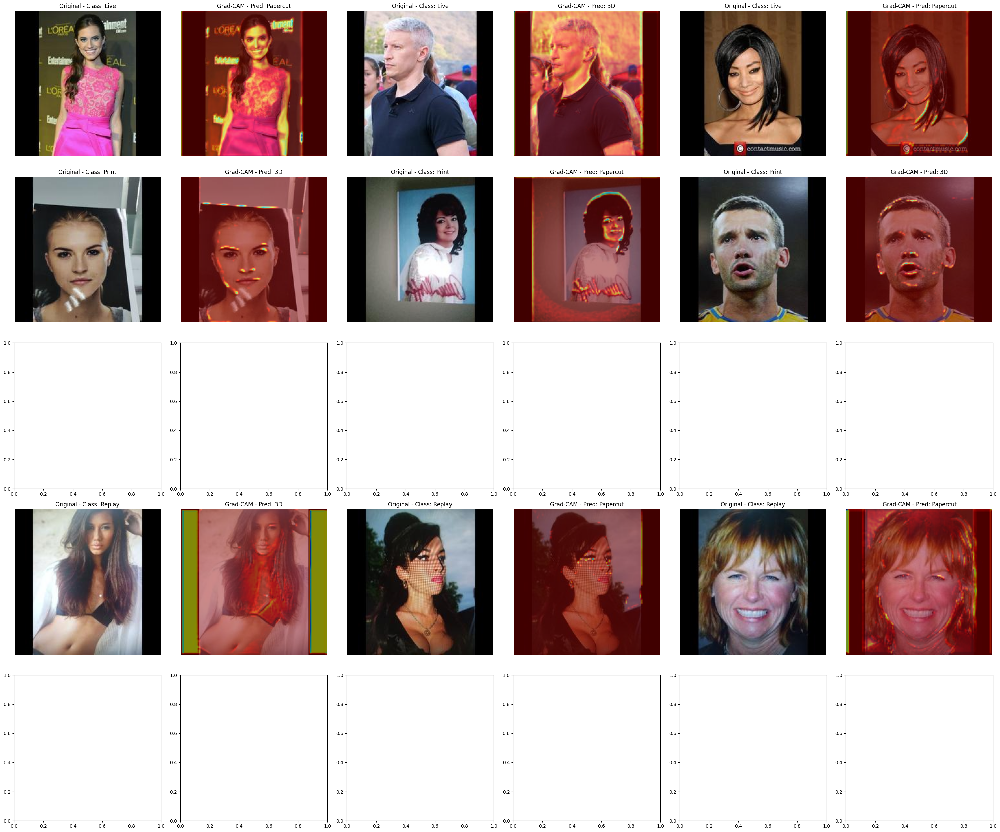

In [37]:
fig, axs = plt.subplots(5, 6, figsize=(30, 25))

for i, (label, images) in enumerate(class_images.items()):
    for j, img_tensor in enumerate(images):
        heatmap, predicted_class = grad_cam_with_prediction(model, img_tensor.unsqueeze(0), label_index=label)
        img = img_tensor.permute(1, 2, 0).numpy()
        img = (img * std + mean)
        img = np.clip(img, 0, 1)
        cam_img = show_cam_on_image(img, heatmap)

        # plot original image
        ax = axs[i, 2 * j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Original - Class: {class_names[label]}")

        # plot Grad-CAM image with prediction
        ax = axs[i, 2 * j + 1]
        ax.imshow(cam_img)
        ax.axis('off')
        ax.set_title(f"Grad-CAM - Pred: {class_names[predicted_class]}")

plt.tight_layout()
plt.show()

In [78]:
def grad_cam(model, image, label_index):
    model.eval()
    output = model(image)
    _, prediction = torch.max(output, 1)
    predicted_class = prediction.item()

    # get gradients from the last convolutional layer
    gradients = model.feature_maps.grad
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

    # get activations from the last convolutional layer and weight them
    activations = model.feature_maps.detach()
    for i in range(pooled_gradients.size(0)):
        activations[:, i, :, :] *= pooled_gradients[i]

    # average the channels of the activations to get the heatmap
    heatmap = torch.mean(activations, dim=1).squeeze()
    heatmap = F.relu(heatmap)

    # normalize the heatmap
    heatmap /= torch.max(heatmap)

    # apply a threshold to enhance visibility of important areas
    threshold = np.percentile(heatmap.numpy(), 75)
    heatmap = np.where(heatmap > threshold, heatmap, 0)

    return heatmap.numpy(), predicted_class

In [77]:
def show_cam_on_image(img, mask):
    # resize mask to match image size
    heatmap = cv2.resize(mask, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # auperimpose the heatmap onto original image
    superimposed_img = heatmap * 0.4 + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype('uint8')

    return superimposed_img


## Comparing results with the official Grad-Cam Library

In [109]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget


In [126]:
model = CNNModel()
model.load_state_dict(torch.load('multiclass_cnn.pth'))
model.eval()

target_layers = [model.conv2]  # use last conv layer

grad_cam = GradCAM(model=model, target_layers=target_layers)

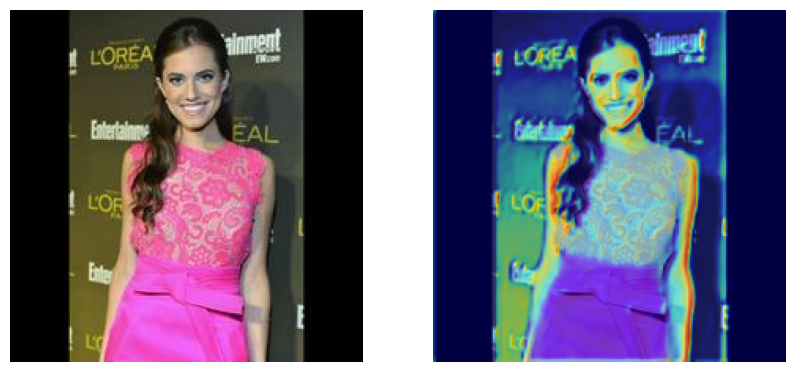

In [129]:
model = CNNModel()
model.load_state_dict(torch.load('multiclass_cnn.pth'))
model.eval()
cam = GradCAM(model=model, target_layers= [model.conv2])

def preprocess_image(img_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    img = Image.open(img_path).convert('RGB')
    return transform(img).unsqueeze(0)

img_path = "/content/preprocessed_data/live/000014.jpg"
input_tensor = preprocess_image(img_path)

# Grad-CAM generation
output = model(input_tensor)
predicted_category = output.argmax(dim=1)
targets = [ClassifierOutputTarget(predicted_category.item())]
grayscale_cam = cam(input_tensor=input_tensor, targets=targets, eigen_smooth=True)
grayscale_cam = grayscale_cam[0, :]

# Display results
img = Image.open(img_path).resize((224, 224))
img_array = np.array(img).astype(np.float32) / 255
visualization = show_cam_on_image(img_array, grayscale_cam, use_rgb=True)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img_array)
ax[0].axis('off')
ax[1].imshow(visualization)
ax[1].axis('off')
plt.show()

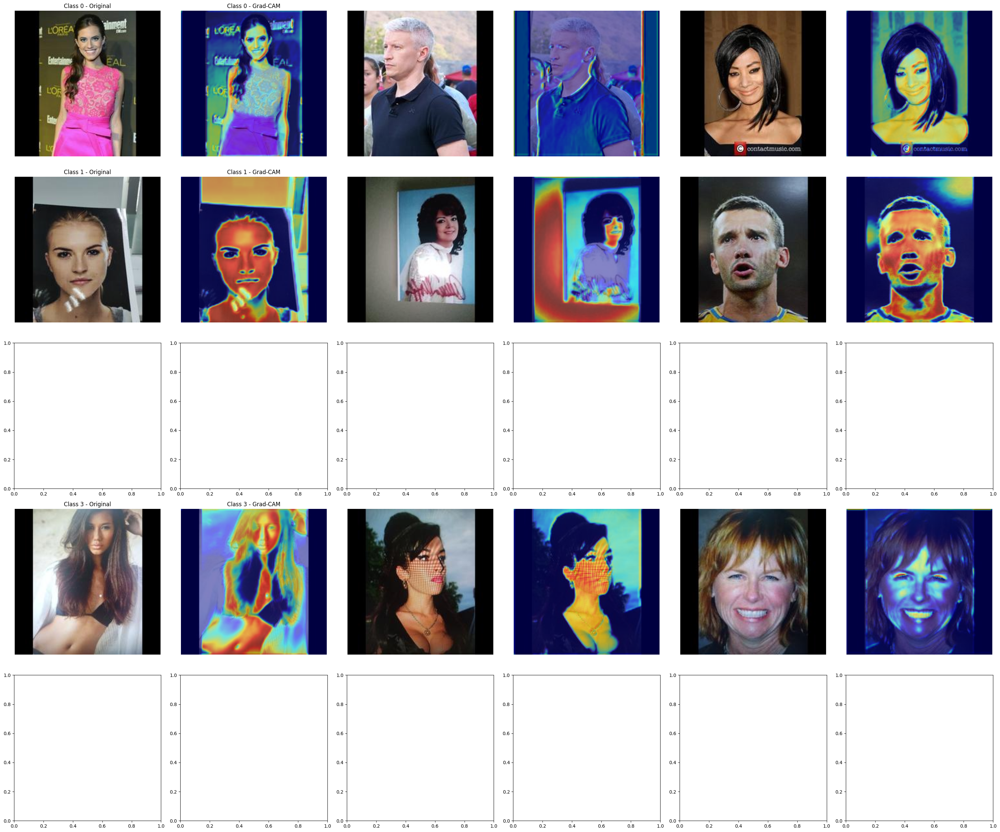

In [133]:
model = CNNModel()
model.load_state_dict(torch.load('multiclass_cnn.pth'))
model.eval()
grad_cam = GradCAM(model=model, target_layers= [model.conv2])

fig, axs = plt.subplots(5, 6, figsize=(30, 25))

for i, (label, images) in enumerate(class_images.items()):
    for j, img_tensor in enumerate(images):
        # generate cam mask
        input_tensor = img_tensor.unsqueeze(0)  # create a batch from the single image
        targets = [ClassifierOutputTarget(0)]  # target category
        grayscale_cam = grad_cam(input_tensor=input_tensor, targets=targets, eigen_smooth=True)
        grayscale_cam = grayscale_cam[0, :]  # take the CAM for the first item in batch

        # prepare image for plotting
        img = img_tensor.permute(1, 2, 0).detach().numpy()
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

        # plot original image and Grad-CAM
        axs[i, 2 * j].imshow(img)
        axs[i, 2 * j + 1].imshow(visualization)
        axs[i, 2 * j].axis('off')
        axs[i, 2 * j + 1].axis('off')
        if j == 0:
            axs[i, 2 * j].set_title(f'Class {label} - Original')
            axs[i, 2 * j + 1].set_title(f'Class {label} - Grad-CAM')

plt.tight_layout()
plt.show()

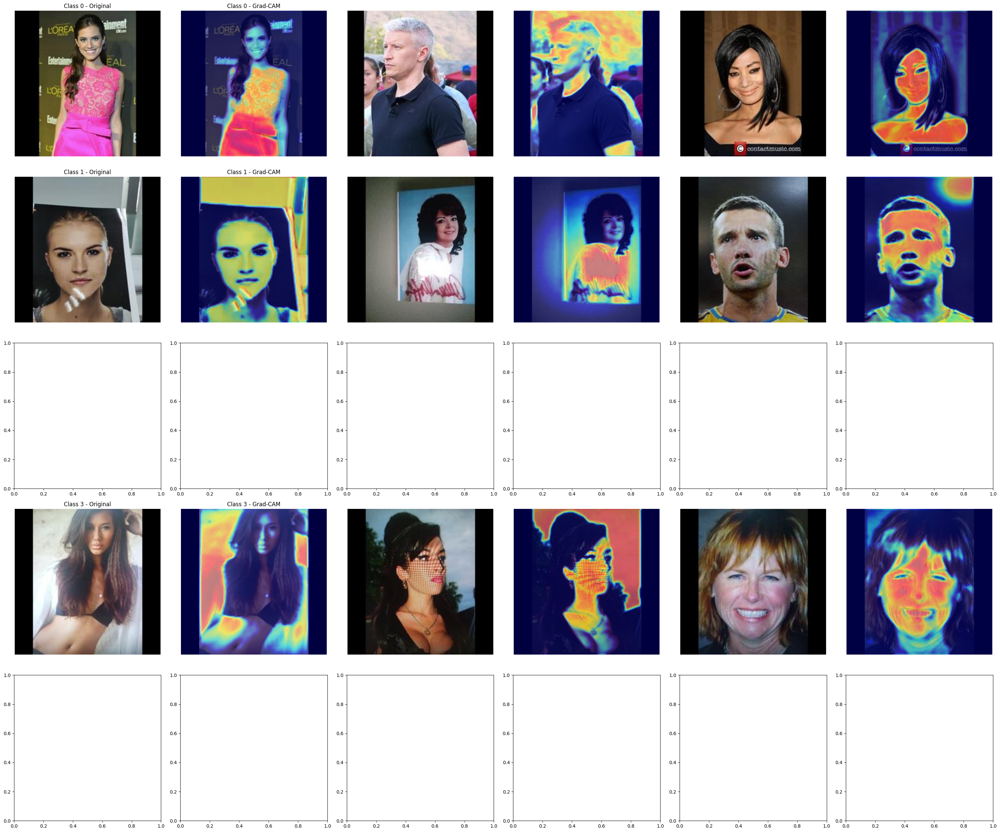

In [85]:
for i, (label, images) in enumerate(class_images.items()):
    for j, img_tensor in enumerate(images):
        # generate cam mask
        input_tensor = img_tensor.unsqueeze(0)  # create a batch from the single image
        targets = [ClassifierOutputTarget(0)]  # target category
        grayscale_cam = grad_cam(input_tensor=input_tensor, targets=targets, eigen_smooth=True)
        grayscale_cam = grayscale_cam[0, :]  # take the CAM for the first item in batch

        # prepare image for plotting
        img = img_tensor.permute(1, 2, 0).detach().numpy()
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

        # plot original image and Grad-CAM
        axs[i, 2 * j].imshow(img)
        axs[i, 2 * j + 1].imshow(visualization)
        axs[i, 2 * j].axis('off')
        axs[i, 2 * j + 1].axis('off')
        if j == 0:
            axs[i, 2 * j].set_title(f'Class {label} - Original')
            axs[i, 2 * j + 1].set_title(f'Class {label} - Grad-CAM')

plt.tight_layout()
plt.show()